# ΟΡΑΣΗ ΥΠΟΛΟΓΙΣΤΩΝ - ΕΡΓΑΣΤΗΡΙΑΚΗ ΑΣΚΗΣΗ 2

### Εκτίμηση Οπτικής Ροής (Optical Flow), εξαγωγή Χαρακτηριστικών σε Βίντεο για αναγνώριση Δράσεων, Συνένωση Εικόνων (Image Stitching)

#### Δωροθέα Κουμίδου 03119712

#### Γιώργος Χαραλάμπους 03119706



## Μέρος 1: Παρακολούθηση Προσώπου και Χεριών με Χρήση της Μεθόδου Οπτικής Ροής των Lucas-Kanade

In [3]:
!pip  install matplotlib

  Using cached matplotlib-3.5.3-cp37-cp37m-win_amd64.whl (7.2 MB)
  Using cached fonttools-4.38.0-py3-none-any.whl (965 kB)
  Using cached pyparsing-3.1.2-py3-none-any.whl (103 kB)
  Using cached Pillow-9.5.0-cp37-cp37m-win_amd64.whl (2.5 MB)
  Using cached kiwisolver-1.4.5-cp37-cp37m-win_amd64.whl (55 kB)
  Using cached cycler-0.11.0-py3-none-any.whl (6.4 kB)


In [1]:
import scipy
import scipy.stats as stats
from scipy.stats import multivariate_normal
import cv2
from scipy import io
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from scipy.ndimage import label,map_coordinates,convolve1d, rank_filter
from numpy import unravel_index
import math
from matplotlib import rcParams
import base64
from numpy.linalg import norm
import os
import sys
%matplotlib inline

### 1.1 Ανίχνευση Δέρματος Προσώπου και Χεριών

In [2]:
samples = scipy.io.loadmat('cv24_lab2_part1/skinSamplesRGB.mat')
skin = cv2.cvtColor(samples['skinSamplesRGB'],cv2.COLOR_RGB2YCrCb)
#Κρατούμε μόνο τα κανάλια Cb Cr 
Cb = skin[:,:,1]
Cr = skin[:,:,2]
mean = [np.mean(Cb),np.mean(Cr)]
cov_matrix = np.array(np.cov(Cb.flatten(),Cr.flatten()))

print("Mean = ",mean)
print("Cov = ",cov_matrix)

Mean =  [156.3186507936508, 104.87420634920635]
Cov =  [[ 34.87142652 -12.72051913]
 [-12.72051913  15.65665876]]


Text(0, 0.5, 'Cb Channel')

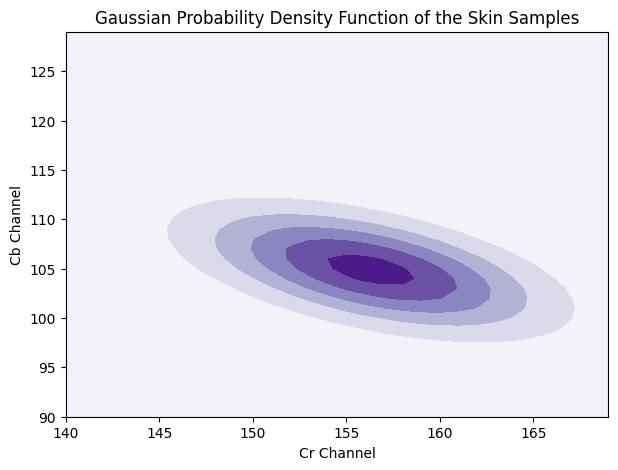

In [3]:
#Gaussian Probability Density with mean and cov as before 
x, y = np.mgrid[140:170:1, 90:130:1]
pos = np.dstack((x, y))
rv = multivariate_normal(mean, cov_matrix)
rcParams['figure.figsize'] = [7,5]
plt.contourf(x, y, rv.pdf(pos), cmap='Purples')
plt.title('Gaussian Probability Density Function of the Skin Samples')
plt.xlabel('Cr Channel')
plt.ylabel('Cb Channel')


In [4]:
def fd(image,mean,cov):
    #RGB to YCrCb
    image_to_YCrCb = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
    #Split to channels
    _,Cr,Cb = cv2.split(image_to_YCrCb)
    #Ignore Y channel
    x = np.array([Cr,Cb]).T
    #Create a multivariate matrix of the image
    p = stats.multivariate_normal.pdf(x,mean,cov).T
    #Apply threshold: instead of [0.05, 0.25]->[0.00005,0.25]
    thresh, skin = cv2.threshold(p,0.00005,0.25,cv2.THRESH_BINARY)
    
    #Opening and closing as morfological filters
    #Kernel for opening 
    small_k = np.ones((5,5),np.uint8)
    #Kernel for closing
    big_k = np.ones((12,12),np.uint8)
    
    opening = cv2.dilate(cv2.erode(skin, small_k),small_k)
    closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, big_k)
    
    #Find the bounding boxes
    labeled, features = label(closing)
    #An array-like object to be labeled. Any non-zero values 
    #in input are counted as features and zero values are 
    #considered the background.
    
    #Subplots for each step 
    fig, ax = plt.subplots(1, 4, figsize = (20,30))
    ax[0].set_title("Original Image(RGB)")
    ax[0].imshow(image)
    ax[1].set_title("YCbCr Image")
    ax[1].imshow(image_to_YCrCb)
    ax[2].set_title("Skin image after opening")
    ax[2].imshow(opening, cmap="gray")
    ax[3].set_title("Skin image after closing")
    ax[3].imshow(closing, cmap="gray")

    print("Detected features:",features)
    coordinates = []
    #For every feature we want to create a box 
    for i in range(features):
        x,y = np.where(labeled == i+1) #find all (x,y) of the areas with label=i+1
        x = np.sort(x) #sort x,y
        y = np.sort(y)
        width = x[-1] - x[0] 
        height = y[-1] - y[0]
        coordinates.append([y[0],x[0],height,width])
        
    print("Head Coords: ", coordinates[0])
    print("Right Hand Coords: ", coordinates[1])
    print("Left Hand Coords:", coordinates[2])
    
    return coordinates

Detected features: 3
Head Coords:  [158, 108, 71, 163]
Right Hand Coords:  [243, 216, 54, 97]
Left Hand Coords: [30, 236, 63, 97]


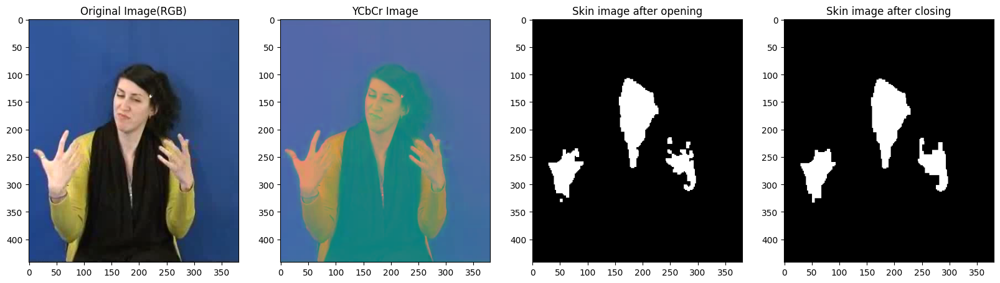

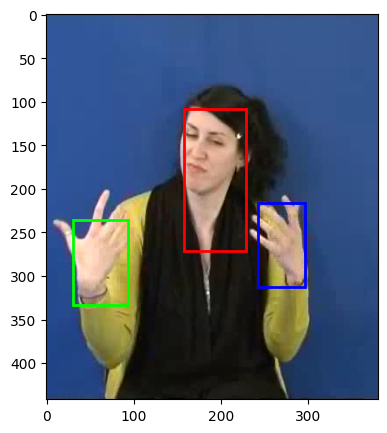

In [5]:
#Read the first image from folder cv24_lab2_part1/
img = cv2.imread("cv24_lab2_part1/1.png")
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

#Each box coordinates for head, left hand and right hand
box1, box2, box3 = fd(img,mean,cov_matrix)
figure, axis = plt.subplots(1)
axis.add_patch(patches.Rectangle((box1[0],box1[1]),box1[2],box1[3], edgecolor='r', facecolor="none",linewidth=2))
axis.add_patch(patches.Rectangle((box2[0],box2[1]),box2[2],box2[3], edgecolor='b', facecolor="none",linewidth=2))
axis.add_patch(patches.Rectangle((box3[0],box3[1]),box3[2],box3[3], edgecolor='lime', facecolor="none",linewidth=2))
axis.imshow(img)
plt.show()

### 1.2 Παρακολούθηση Προσώπου και Χεριών

In [6]:
## coordinates of each part
face_coord = [154,102,67,115]
right_hand_coord = [243, 216, 55, 100]
left_hand_coord = [30, 220, 70, 97]


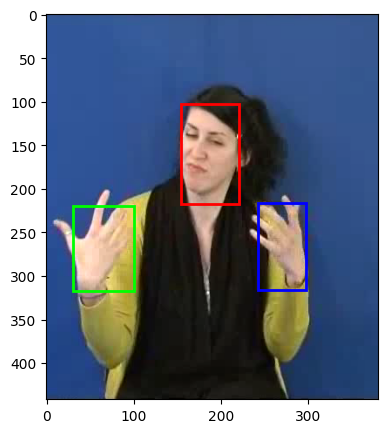

In [7]:
img = cv2.imread("cv24_lab2_part1/1.png")
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

#Each box coordinates for head, left hand and right hand

figure, axis = plt.subplots(1)
axis.add_patch(patches.Rectangle((face_coord[0],face_coord[1]),face_coord[2],face_coord[3], edgecolor='r', facecolor="none",linewidth=2))
axis.add_patch(patches.Rectangle((right_hand_coord[0],right_hand_coord[1]),right_hand_coord[2],right_hand_coord[3], edgecolor='b', facecolor="none",linewidth=2))
axis.add_patch(patches.Rectangle((left_hand_coord[0],left_hand_coord[1]),left_hand_coord[2],left_hand_coord[3], edgecolor='lime', facecolor="none",linewidth=2))
axis.imshow(img)
plt.show()

In [8]:
#1.2.1 Υλοποίηση του Αλγόριθμου των Lucas-Kanade

def lk(I1,I2,features,rho,epsilon,d_x0,d_y0):
    #I1: template image
    #I2: moved image
    
    #Gradient of the image
    Iy,Ix=np.gradient(I1)
    
    #2D Gaussian  
    n = int(np.ceil(3*rho)*2+1)
    g1d = cv2.getGaussianKernel(n,rho)
    g2d = g1d @ g1d.T
    
   #Initialization of dx and dy
    d_xi = d_x0  #dx for each pixel 
    d_yi = d_y0  #dy for each pixel
    
    height,width = I1.shape
    #In order to calculate the partial derivatives of the whole image we need to make  mesh 
    x_0,y_0=np.meshgrid(np.arange(width),np.arange(height))
    
    #Features extracted  by cv2.goodFeaturesToTrack() and used as parameters 
    # 3D [num_of_corners_found]*[x,y location of each corner]
    for i in range(features.shape[0]):  #update dx,dy for every features
        x = features[i][0][0].astype(int)
        y = features[i][0][1].astype(int)
        dx = d_x0[y][x]
        dy = d_y0[y][x]
        u = np.array([[0,0]]) 
        dx_prev,dy_prev = 0,0  # Initialization of prev values 
        
        # 2 Different Criterions 
        criterion1 = (np.abs(dx-dx_prev)>1e-3) or (np.abs(dy-dy_prev)>1e-3)
        iteration = 0
        criterion2 = iteration<100
        
        while iteration<100:
            iteration+=1       ## uncomment for criterion2
            dx_prev,dy_prev = dx,dy
            
            #I_n−1(x + d)
            I_prev = map_coordinates(I1, [y_0 + dy,x_0 + dx], order=1, mode='nearest').reshape(I1.shape)
            #[A1(x) A2(x)]= [∂In−1(x + di)/∂x   ∂In−1(x + di)/∂y]
            A1 = map_coordinates(Ix, [y_0 + dy,x_0+ dx], order=1, mode='nearest').reshape(I1.shape)
            A2 = map_coordinates(Iy, [y_0 + dy,x_0 + dx], order=1, mode='nearest').reshape(I1.shape)
            #E(x) = I_n(x) − I_n−1(x + di)
            E = I2 - I_prev
            
            #Make the u(x) array 
            # A=([(Gρ ∗ A21)(x) + ϵ    (Gρ ∗ (A1A2)) (x) ]
            #    [(Gρ ∗ (A1A2))(x)     (Gρ ∗ A22)(x) + ϵ ]
            #    
            #  B= [(Gρ ∗ (A1E)) (x)  ]
            #     [(Gρ ∗ (A2E)) (x)  ]
            #   
            # u(x)= A^(-1) @ B
            #
            a11 = cv2.filter2D(A1.astype(np.float64)**2,-1,g2d)+epsilon
            a12 = cv2.filter2D((A1*A2).astype(np.float64),-1,g2d)
            a21 = a12
            a22 = cv2.filter2D(A2.astype(np.float64)**2,-1,g2d)+epsilon

            A = np.array([[a11[y,x],a12[y,x]],
                          [a21[y,x],a22[y,x]]])
            
            b11 = cv2.filter2D((A1*E).astype(np.float64),-1,g2d)
            b21 = cv2.filter2D((A2*E).astype(np.float64),-1,g2d)
            B = np.array([[b11[y,x]],
                          [b21[y,x]]])
            
            A_inv = np.linalg.inv(A)
           
            u = np.matmul(A_inv,B)
            dx += u[0,0]
            dy += u[1,0]
            
        d_xi[y][x] = -dx
        d_yi[y][x] = -dy
    
    return d_xi,d_yi  

In [52]:
#1.2.2 Υπολογισμός της Μετατόπισης των Παραθύρων από τα Διανύσματα Οπτικής Ροής
def displ(dx,dy,thesh):
    d = dx**2+dy**2
    condition = (d >= (thesh * np.max(d))).astype(int) ## binary matrix: 1 where valid, 0 elsewhere 
    dx = condition*dx
    dy = condition*dy ## only the points that survive the condition
    m_dx = np.sum(dx)/np.sum(condition)
    m_dy = np.sum(dy)/np.sum(condition)
    return m_dx,m_dy

Predicted movement of bounding box for dx,dy=1: (-0.9987766495197028, -1.0045213776620123)
Predicted movement of bounding box for dx,dy=2: (-1.9945537999166794, -2.006126501207141)
Predicted movement of bounding box for dx,dy=5: (-3.8141748078451645, -4.860983999425006)
Predicted movement of bounding box for dx,dy=10: (-7.634346454074795, -4.146187061235982)
Predicted movement of bounding box for dx,dy=15: (-6.864024538105413, 1.1419794961515417)


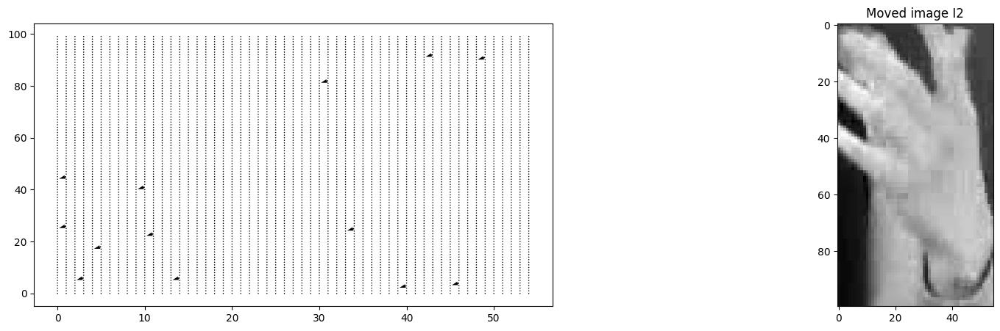

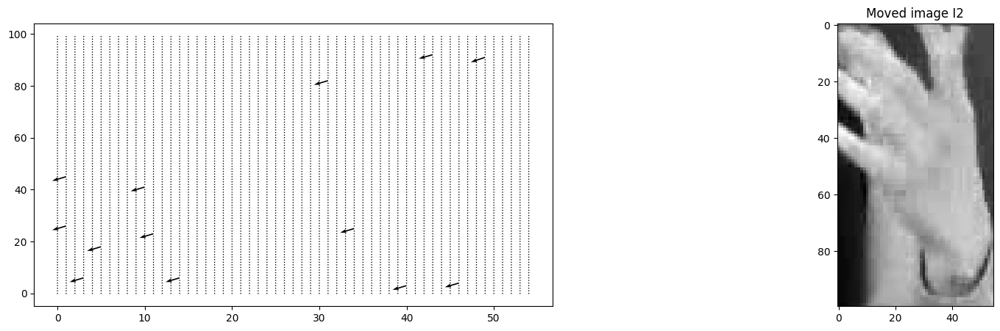

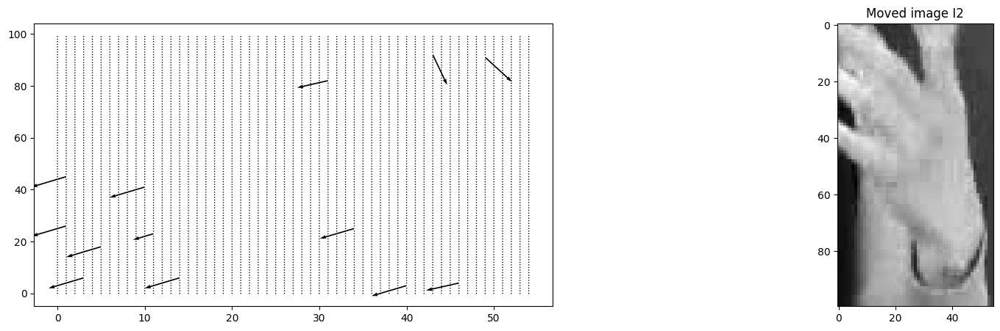

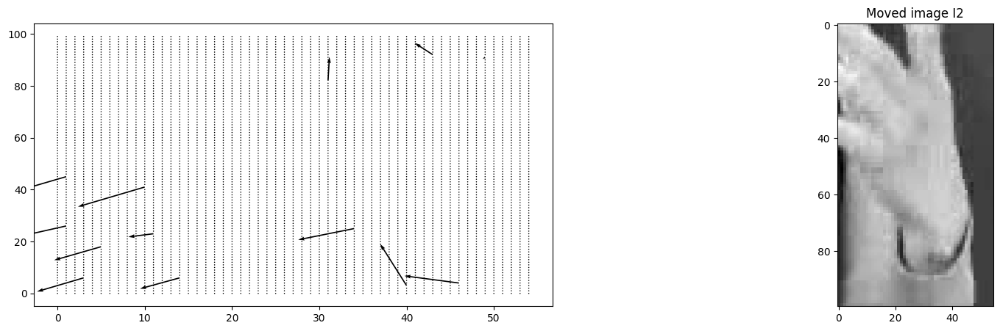

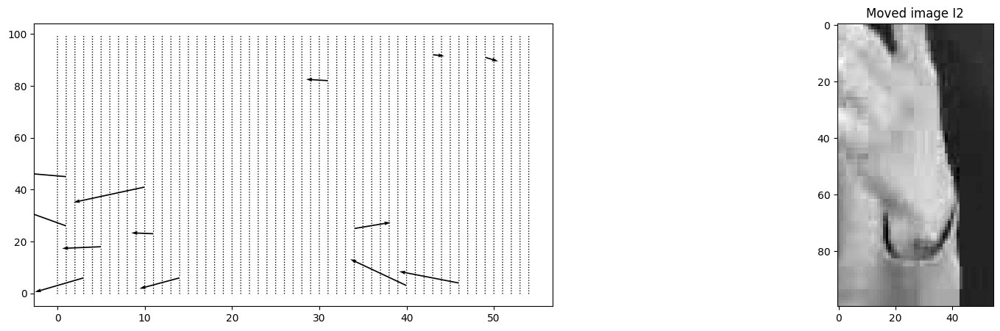

In [53]:
#Τesting for different dx,dy, to test the limits of lucas-kanade
offset = [1,2,5,10,15]
img = cv2.imread("cv24_lab2_part1/1.png")
gray_img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
gray_img = gray_img.astype(np.float32)/255 #normalize image
for off in offset:
    x,y,w,h = right_hand_coord
    I1 = gray_img[y:y+h,x:x+w]
    I2 = gray_img[y+off:y+h+off,x+off:x+w+off]
    feats = cv2.goodFeaturesToTrack(I1,1000,0.1,0.1)
    dx0 = np.zeros(I1.shape)
    dy0 = np.zeros(I1.shape)
    dx,dy = lk(I1,I2,feats,rho=5,epsilon=0.01,d_x0=dx0,d_y0=dy0)
    print(f"Predicted movement of bounding box for dx,dy={off}:",displ(dx,dy,0.2))
    fig, axis = plt.subplots(1,2,figsize = (20,5))
    axis[0].quiver(dx, dy, angles='xy', scale=100)
    axis[1].imshow(I2,cmap="gray")
    axis[1].set_title("Moved image I2")

In [54]:
#Tracking all parts with 2 different methods(Lk, and TVL1)
def simple_tracker(limit=65,flow_type=True):
    
    #Based of what calculated on the 1.1 
    face_coord = [154,102,67,115]
    right_hand_coord = [243, 216, 55, 100]
    left_hand_coord = [30, 220, 70, 97]
    
    x = np.array([face_coord[0],right_hand_coord[0],left_hand_coord[0]])
    y = np.array([face_coord[1],right_hand_coord[1],left_hand_coord[1]])
    w = np.array([face_coord[2],right_hand_coord[2],left_hand_coord[2]])
    h = np.array([face_coord[3],right_hand_coord[3],left_hand_coord[3]])
    
    def box_tvl1(d): 
        dx= d[:,:,0]
        dy= d[:,:,1]
        d_2 = np.square(dx) + np.square(dy)
        cond = (d_2 > np.mean(d_2)).astype(int)
        rem_dx = dx*cond
        rem_dy = dy*cond
        return (np.mean(rem_dx), np.mean(rem_dy))   
    
    for frame in range(1,limit):
        img1 = cv2.imread(f"cv24_lab2_part1/{frame}.png")
        gray_img1 = cv2.cvtColor(img1,cv2.COLOR_BGR2GRAY)
        gray_img1 = gray_img1.astype(np.float32)/255 #normalize image

        img2 = cv2.imread(f"cv24_lab2_part1/{frame+1}.png")
        gray_img2 = cv2.cvtColor(img2,cv2.COLOR_BGR2GRAY)
        gray_img2 = gray_img2.astype(np.float32)/255 #normalize image
        
        for i in range(3):
            I1 = gray_img1[y[i]:y[i]+h[i],x[i]:x[i]+w[i]]
            I2 = gray_img2[y[i]:y[i]+h[i],x[i]:x[i]+w[i]]

            feats = cv2.goodFeaturesToTrack(I1,1000,0.1,0.1)
            dx0 = np.zeros(I1.shape)
            dy0 = np.zeros(I1.shape)
            
            # Flow_type = True ==> LK else we do TVL1
            if flow_type:
                dx,dy = lk(I1,I2,feats,rho=5,epsilon=0.01,d_x0=dx0,d_y0=dy0)
                box_x,box_y = displ(dx,dy,0.2)
            else:
                opt_flow = cv2.DualTVL1OpticalFlow_create()
                flow = opt_flow.calc(I1,I2,None)
                box_x,box_y = box_tvl1(flow)
            
            x[i] += round(box_x)
            y[i] += round(box_y)
            
        for i in range(3):
            out = cv2.rectangle(img2, ((x[i]),(y[i])), ((x[i])+w[i], (y[i])+h[i]), (255,0,0), 2)

        print(f'Image: {frame}')
        print("Approximate movement of bounding box:",box_x,box_y)
        plt.imshow(img2)
        plt.show()
        

Image: 1
Approximate movement of bounding box: 3.605821844104611 -13.063062000417963


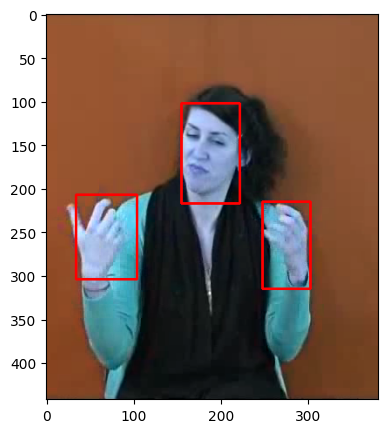

Image: 2
Approximate movement of bounding box: 9.48767589668172 -0.07071295586549109


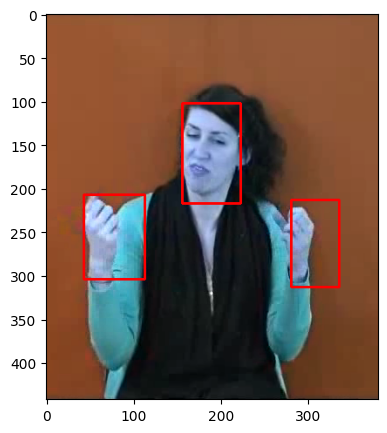

Image: 3
Approximate movement of bounding box: 4.431021718126264 -4.5308214561960005


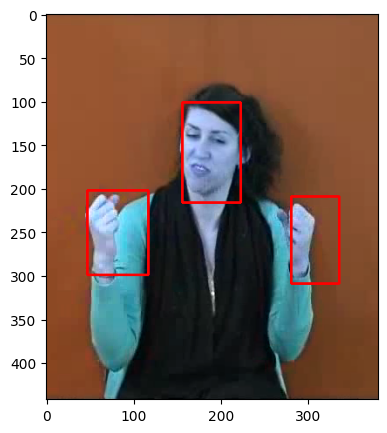

Image: 4
Approximate movement of bounding box: 3.6219668822809776 -1.7289234978660792


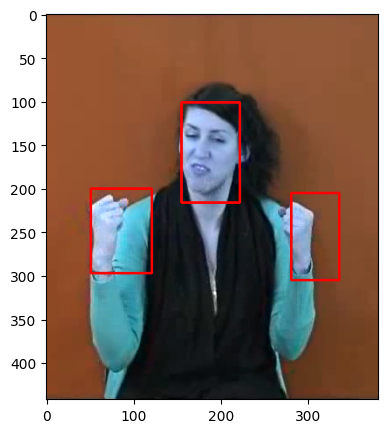

Image: 5
Approximate movement of bounding box: -2.5065699679066444 1.1524620206253329


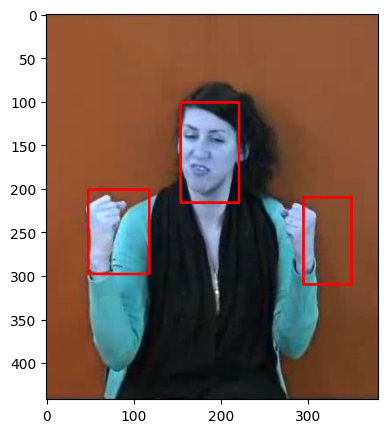

Image: 6
Approximate movement of bounding box: -5.9160847816605155 4.567058668350372


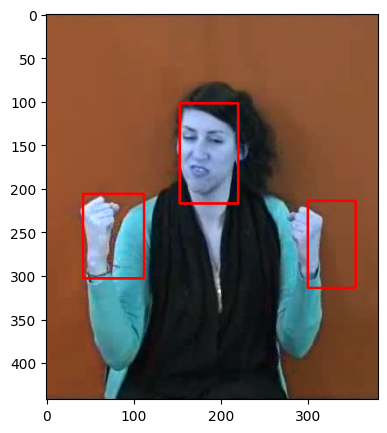

Image: 7
Approximate movement of bounding box: 1.308343612586703 -1.2182048434155022


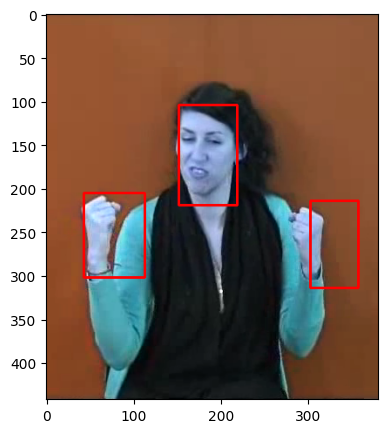

Image: 8
Approximate movement of bounding box: 31.562227508947636 -1.499342485986301


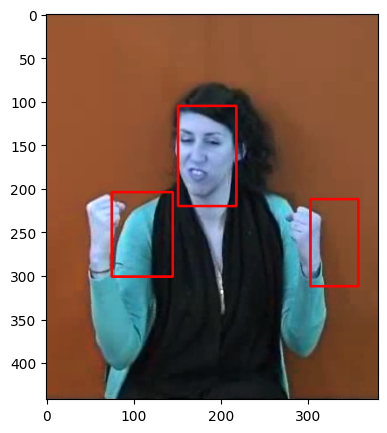

Image: 9
Approximate movement of bounding box: 15.028309410119299 2.703144163819517


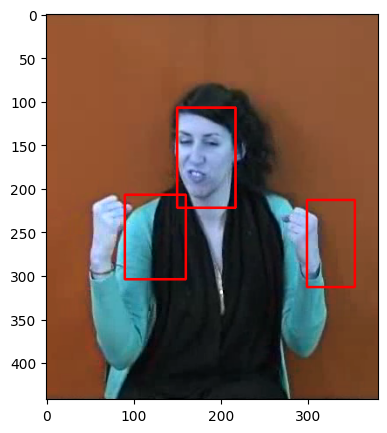

Image: 10
Approximate movement of bounding box: 34.18135456051202 0.46519537538785666


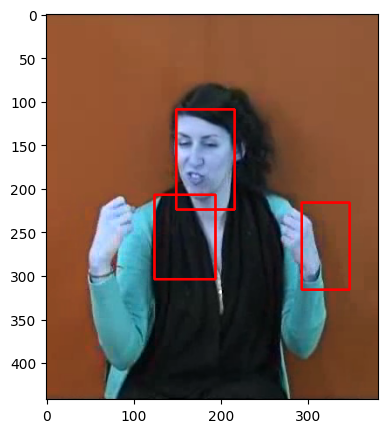

Image: 11
Approximate movement of bounding box: 0.6547106199021824 2.827854476652547


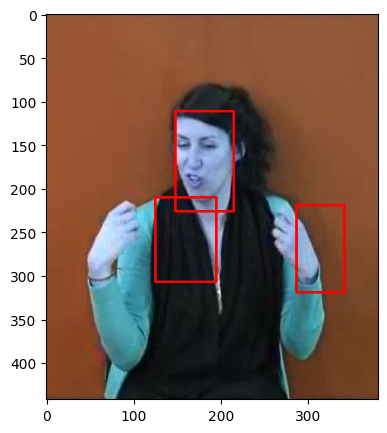

Image: 12
Approximate movement of bounding box: 0.5340843964235312 1.877193272719394


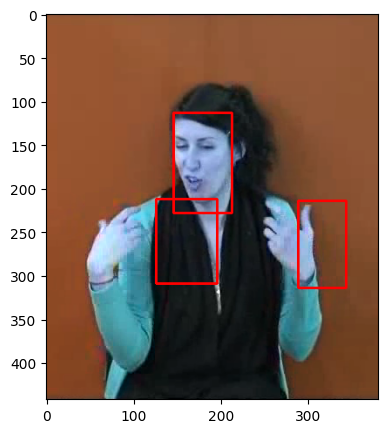

Image: 13
Approximate movement of bounding box: 0.41831097908069437 -0.27129856557706217


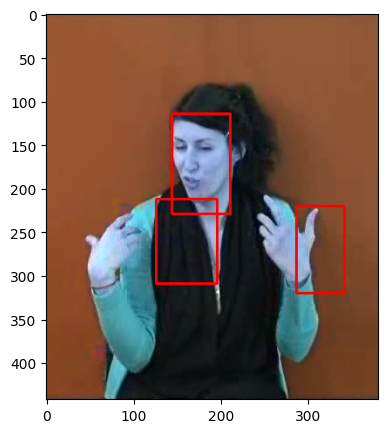

Image: 14
Approximate movement of bounding box: 0.2466529281739395 -0.6951236007622291


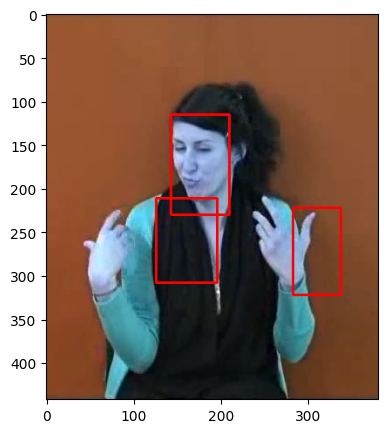

In [79]:
# Lucal- Kanade method 
#########################
simple_tracker(limit=15)

Image: 1
Approximate movement of bounding box: 1.1398513823192133 -2.351522141177103


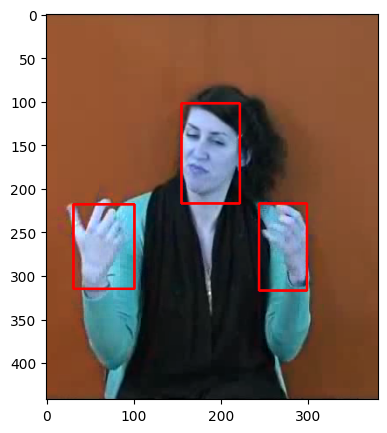

Image: 2
Approximate movement of bounding box: 2.353988896922616 -2.5877321700108773


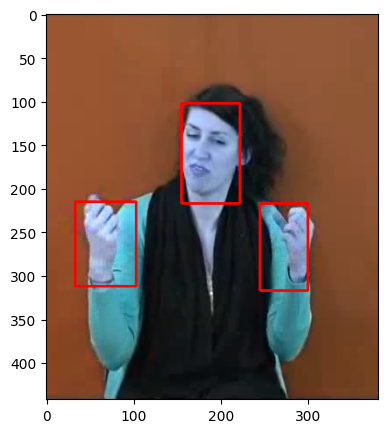

Image: 3
Approximate movement of bounding box: 2.082124065817368 -2.0678153044907637


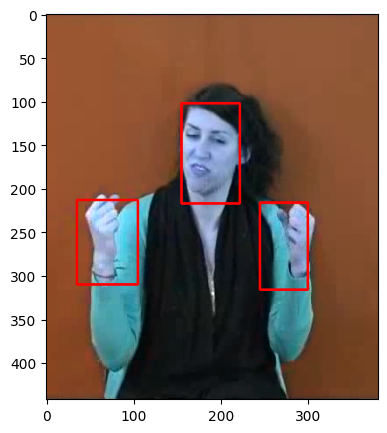

Image: 4
Approximate movement of bounding box: 1.49791804978923 -1.335521338469951


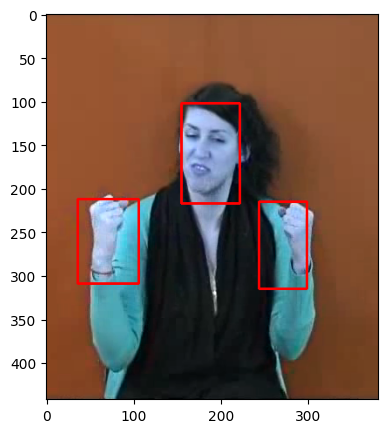

Image: 5
Approximate movement of bounding box: -1.9308065834031365 -0.21917180326497746


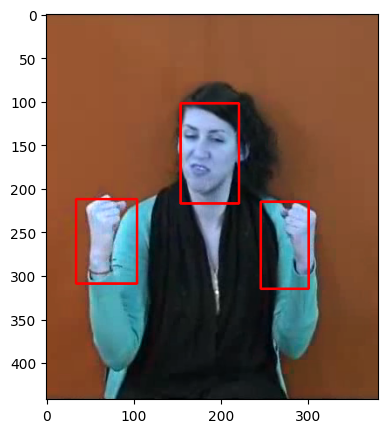

Image: 6
Approximate movement of bounding box: -2.28338682588316 0.6635285354634974


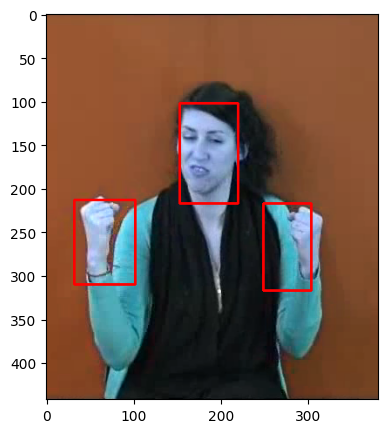

Image: 7
Approximate movement of bounding box: 0.6878239942261941 -0.985292581490492


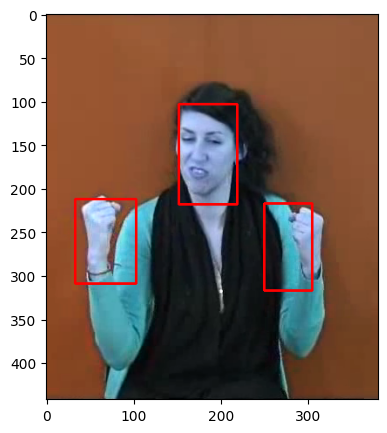

Image: 8
Approximate movement of bounding box: 1.8640736310225698 -0.6198388285024177


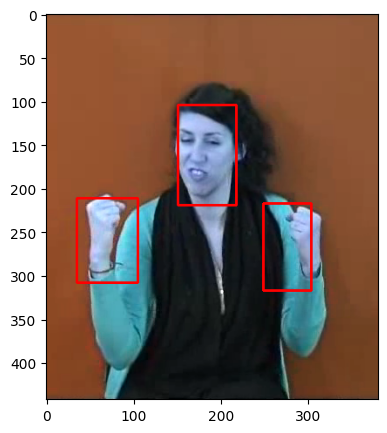

Image: 9
Approximate movement of bounding box: 2.0091948300226976 0.6585142028832119


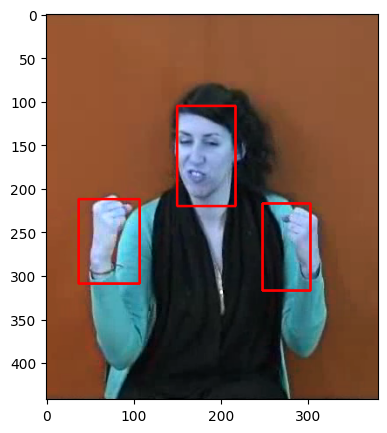

Image: 10
Approximate movement of bounding box: 2.861383674422139 0.5324950580568834


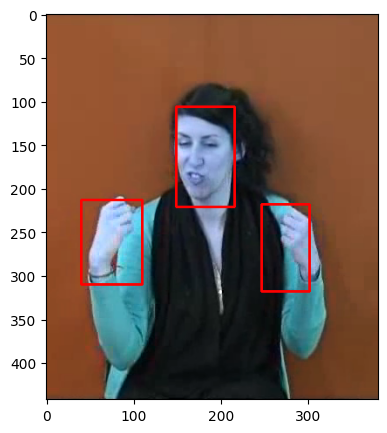

Image: 11
Approximate movement of bounding box: 1.7021133387036105 1.2135606435814732


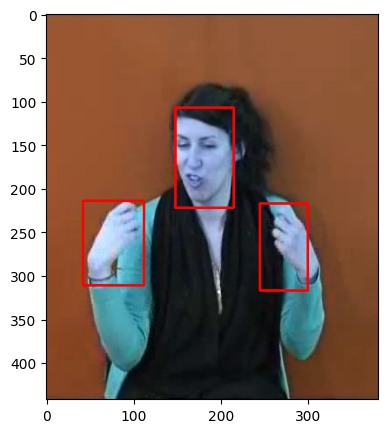

Image: 12
Approximate movement of bounding box: -0.761082743606441 1.9163791625583557


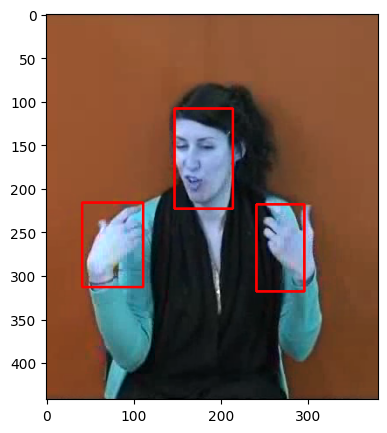

Image: 13
Approximate movement of bounding box: -1.9105621773157055 3.5086650337667282


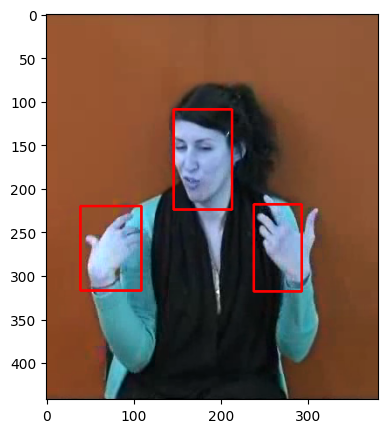

Image: 14
Approximate movement of bounding box: -1.4630280067142927 1.9538320471199342


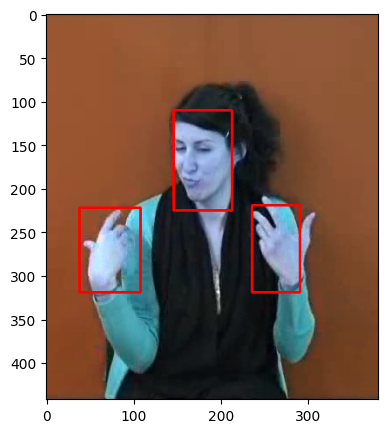

In [80]:
# TVL1 method
##########################
simple_tracker(limit=15,flow_type=False)

In [55]:
#1.2.3 Πολυ-Κλιμακωτός Υπολογισμός Οπτικής Ροής
#################################################
def downscale_corners(feats):
    new_feats = []
    for x,y in feats[:,0,:].astype(int):
        new_feats.append([[int(x/2),int(y/2)]])
    return np.array(new_feats)
    
def multiscale_lk(I1,I2,rho,epsilon,scales):
    #@2D Gaussian filter
    n = int(np.ceil(3*rho)*2+1)
    g1d = cv2.getGaussianKernel(n,rho)
    g2d = g1d @ g1d.T    
    
    feats = cv2.goodFeaturesToTrack(I2,1000,0.1,0.1)
    
    #Initialization for the first scale
    I1_scales = [I1]
    I2_scales = [I2]
    
    dx,dy = np.zeros(I1.shape),np.zeros(I1.shape)
    
    for i in range(scales-1): 
        #Downsampling I1,I2
        I1 = cv2.pyrDown(cv2.filter2D(I1,-1,g2d))
        I2 = cv2.pyrDown(cv2.filter2D(I2,-1,g2d))
        I1_scales.append(I1)
        I2_scales.append(I2)
    for i in range(scales): 
        I1 = I1_scales[i]
        I2 = I2_scales[i]
        feats = downscale_corners(feats)
        #Using Lucas-kanade  from 1.2.2 step for each scale 
        dx,dy = lk(I1,I2,feats,rho,epsilon,dx,dy)
    
    return dx,dy
        
        

Predicted movement of bounding box: (-2.2754347579649226, -1.8488396020798887)


Text(0.5, 1.0, 'Moved image I2')

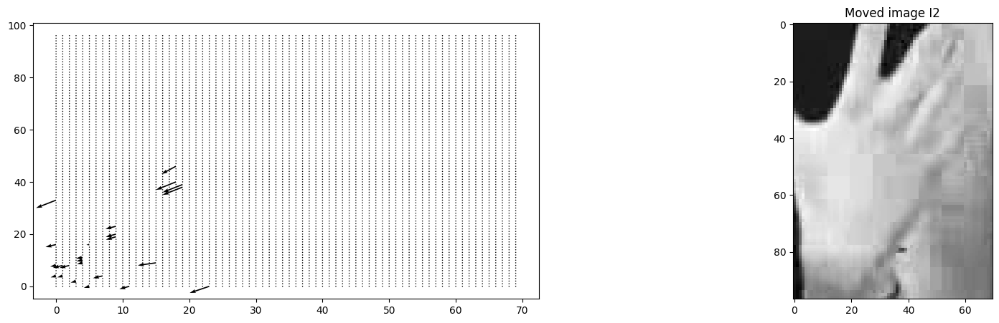

In [56]:
#Testing multiscale Lucas-Kanade
img = cv2.imread("cv24_lab2_part1/1.png")
gray_img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
gray_img = gray_img.astype(np.float32)/255 #normalize image

## test on left hand
x,y,w,h = left_hand_coord
I1 = gray_img[y:y+h,x:x+w]
I2 = gray_img[y+3:y+h+3,x+3:x+w+3]

dx,dy = multiscale_lk(I1,I2,5,0.01,3)

print("Predicted movement of bounding box:",displ(dx,dy,0.2))
fig, axis = plt.subplots(1,2,figsize = (20,5))
axis[0].quiver(dx, dy, angles='xy', scale=100)
axis[1].imshow(I2,cmap="gray")
axis[1].set_title("Moved image I2")


In [77]:
## Tracking all parts using multiscale lk()
def ms_tracker(limit=66):
    
    #Based of what calculated on the 1.1 
    face_coord = [154,102,67,115]
    right_hand_coord = [243, 216, 55, 100]
    left_hand_coord = [30, 220, 70, 97]
    
    x = np.array([face_coord[0],right_hand_coord[0],left_hand_coord[0]])
    y = np.array([face_coord[1],right_hand_coord[1],left_hand_coord[1]])
    w = np.array([face_coord[2],right_hand_coord[2],left_hand_coord[2]])
    h = np.array([face_coord[3],right_hand_coord[3],left_hand_coord[3]])
    
    for frame in range(1,limit):
        img1 = cv2.imread(f"cv24_lab2_part1/{frame}.png")
        gray_img1 = cv2.cvtColor(img1,cv2.COLOR_BGR2GRAY)
        gray_img1 = gray_img1.astype(np.float32)/255 #normalize image

        img2 = cv2.imread(f"cv24_lab2_part1/{frame+1}.png")
        gray_img2 = cv2.cvtColor(img2,cv2.COLOR_BGR2GRAY)
        gray_img2 = gray_img2.astype(np.float32)/255 #normalize image
        
        
        for i in range(3):
            I1 = gray_img1[y[i]:y[i]+h[i],x[i]:x[i]+w[i]]
            I2 = gray_img2[y[i]:y[i]+h[i],x[i]:x[i]+w[i]]
            dx,dy = multiscale_lk(I1,I2,5,0.01,5)
            
            box_x, box_y = displ(dx,dy,0.2)
            x[i] += int(box_x)
            y[i] += int(box_y)
            
        for i in range(3):
            out = cv2.rectangle(img2, ((x[i]),(y[i])), ((x[i])+w[i], (y[i])+h[i]), (255,0,0), 2)

        print(f'Image: {frame}')
        print("Approximate movement of bounding box:",box_x,box_y)
        plt.imshow(img2)
        plt.show()

Image: 1
Approximate movement of bounding box: 0.25367939283472146 -6.0702483381304955


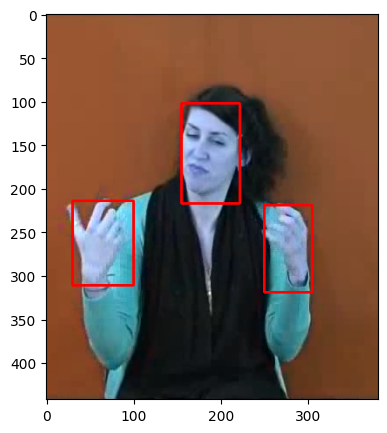

Image: 2
Approximate movement of bounding box: 5.330437594266945 -3.300231247828008


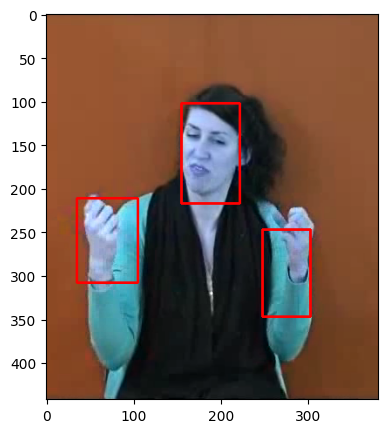

Image: 3
Approximate movement of bounding box: 5.402244128302822 -0.33047663468055516


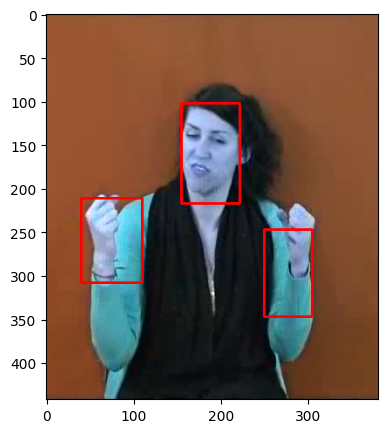

Image: 4
Approximate movement of bounding box: 3.6023354602985243 0.14968337936194268


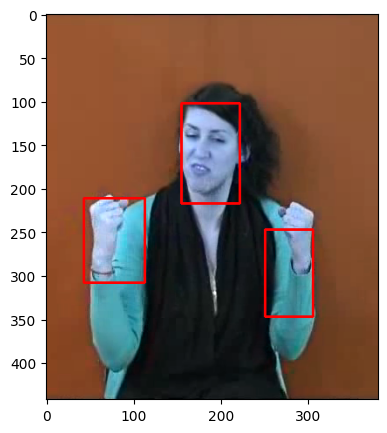

Image: 5
Approximate movement of bounding box: -2.4127012156146543 0.05822777978545572


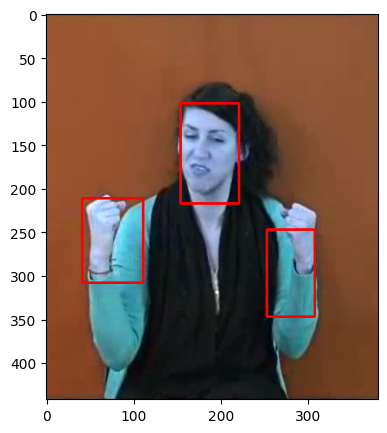

Image: 6
Approximate movement of bounding box: -4.092033353886486 1.0753554595559132


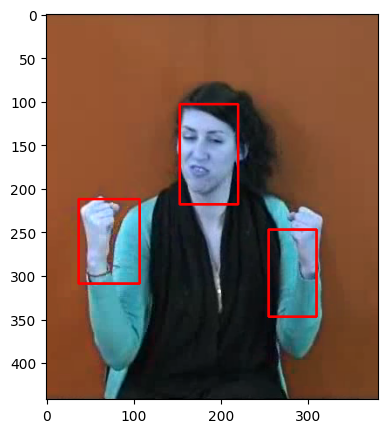

Image: 7
Approximate movement of bounding box: 1.0357756481410456 -1.008363997952164


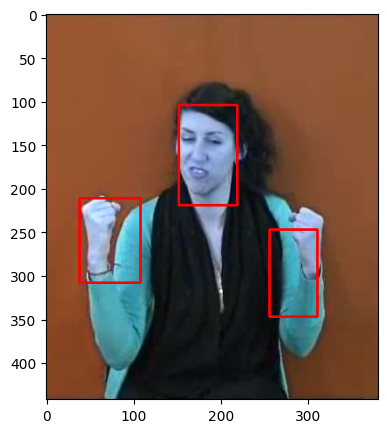

Image: 8
Approximate movement of bounding box: 3.463066442065039 -1.190806177603756


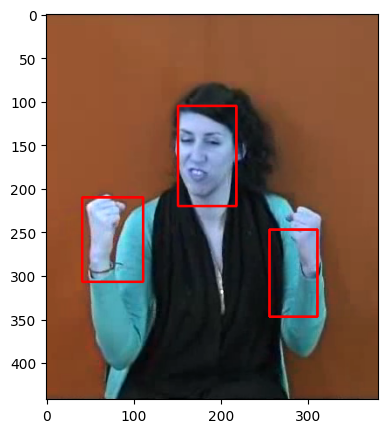

Image: 9
Approximate movement of bounding box: 4.193200450706081 0.8561428950766865


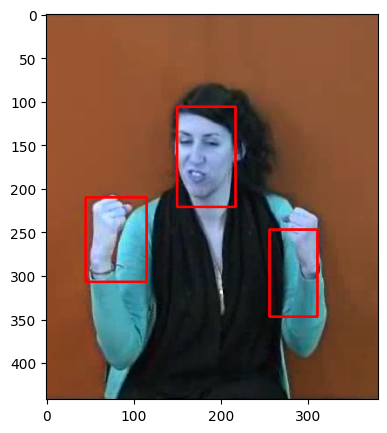

Image: 10
Approximate movement of bounding box: 5.380456270568404 4.588445316295888


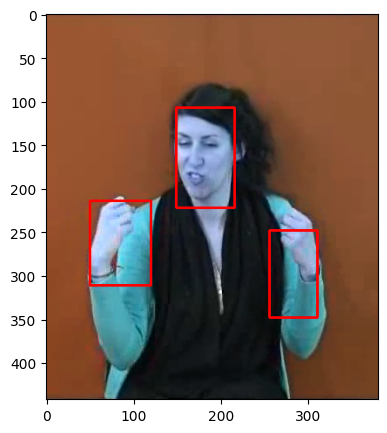

Image: 11
Approximate movement of bounding box: 6.5876265642666665 5.1434509254111065


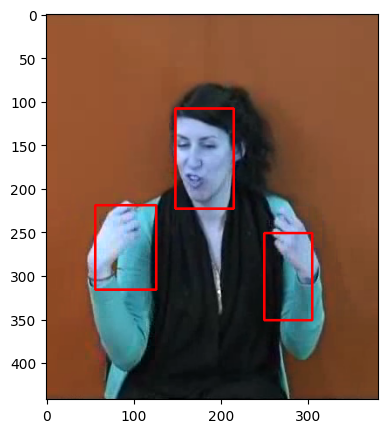

Image: 12
Approximate movement of bounding box: 3.8935176440945924 4.467676895636473


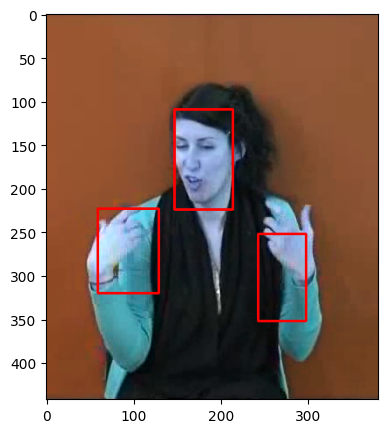

Image: 13
Approximate movement of bounding box: 12.66405829156674 5.903912413641119


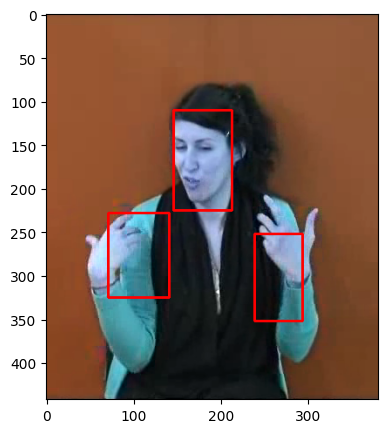

Image: 14
Approximate movement of bounding box: -5.2842494025397775 -2.042525271779038


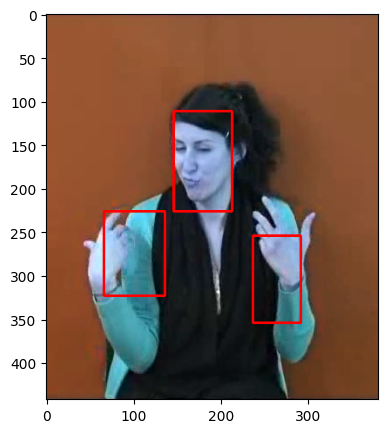

In [78]:
# Multiscale Lucal- Kanade method 
#########################
ms_tracker(limit=15)

#### Ανάλυση παραμέτρων lucas-kanade 

In [73]:
#Ανάλυση τιμών παραμέτρων ρ, ϵ και κατωφλίου ενέργειας(thesh) και scale
#Οι παραμέτροι ρ,ε και thesh ελέγχονται για ευκολία με τη συνάρτηση lk()
epsilons=[0.01, 0.025, 0.05, 0.075, 0.1]
r0s=[1,2,3,4,5]
scales=[1,2,3,4,5]
thrs=[0.001,0.1,0.2,0.5,1]


img = cv2.imread("cv24_lab2_part1/1.png")
gray_img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
gray_img = gray_img.astype(np.float32)/255 #normalize image

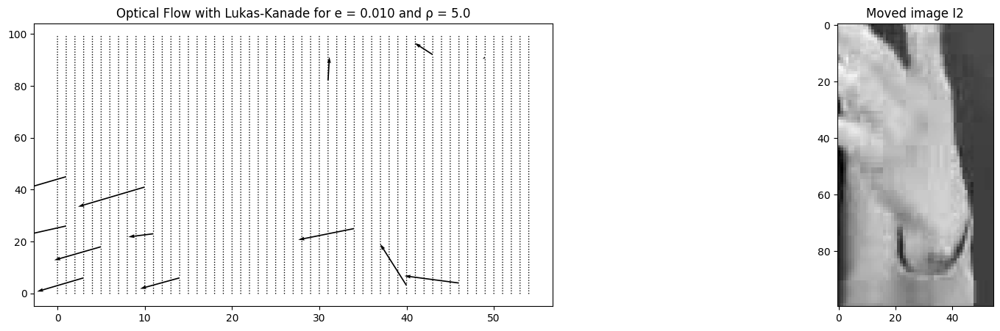

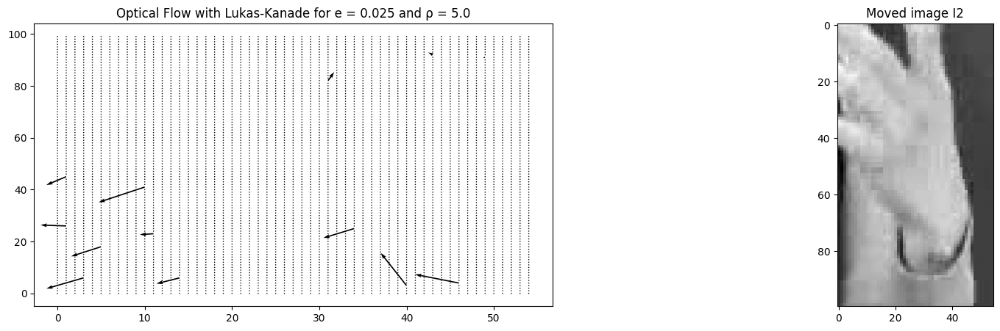

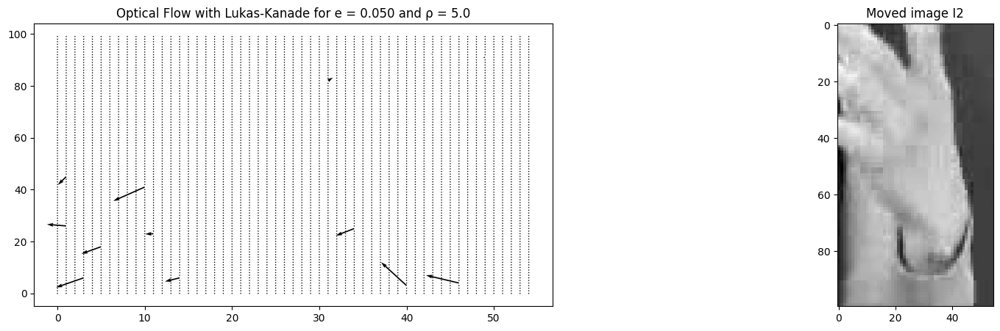

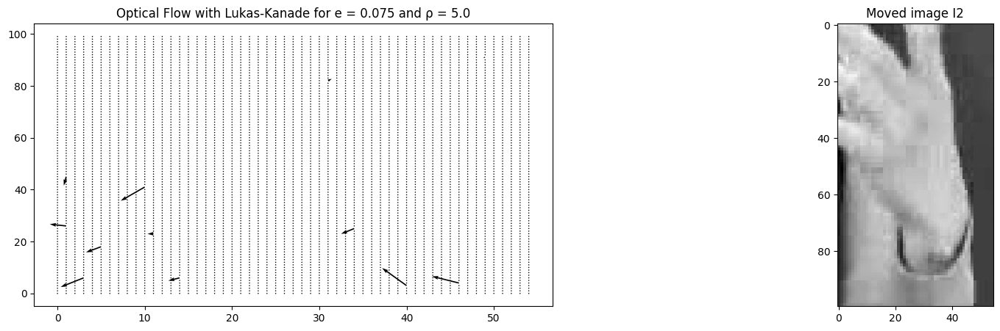

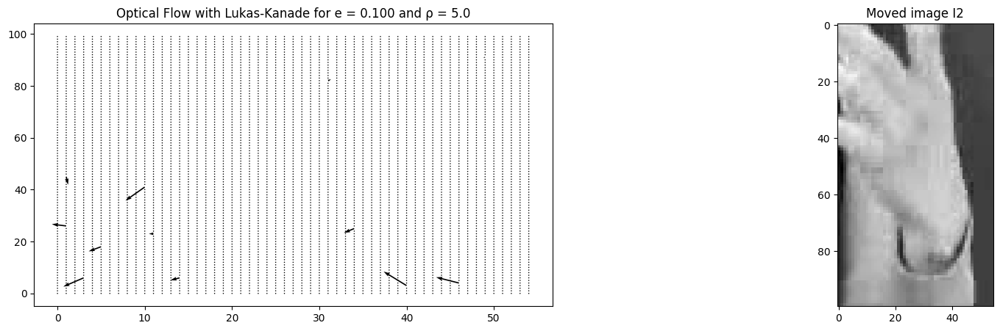

In [58]:
#1) Analysis of ε parameter
###########################
for i in range(5):
    x,y,w,h = right_hand_coord
    I1 = gray_img[y:y+h,x:x+w]
    I2 = gray_img[y+10:y+h+10,x+10:x+w+10]
    feats = cv2.goodFeaturesToTrack(I1,1000,0.1,0.1)
    dx0 = np.zeros(I1.shape)
    dy0 = np.zeros(I1.shape)
    dx,dy = lk(I1,I2,feats,rho=5,epsilon=epsilons[i],d_x0=dx0,d_y0=dy0)
    e0=float(epsilons[i]) 
    r0=5
    fig, axis = plt.subplots(1,2,figsize = (20,5))
    axis[0].quiver(dx, dy, angles='xy', scale=100)
    axis[0].set_title("Optical Flow with Lukas-Kanade for e = %.3f" % e0 + " and ρ = %.1f" %r0)
    axis[1].imshow(I2,cmap="gray")
    axis[1].set_title("Moved image I2")

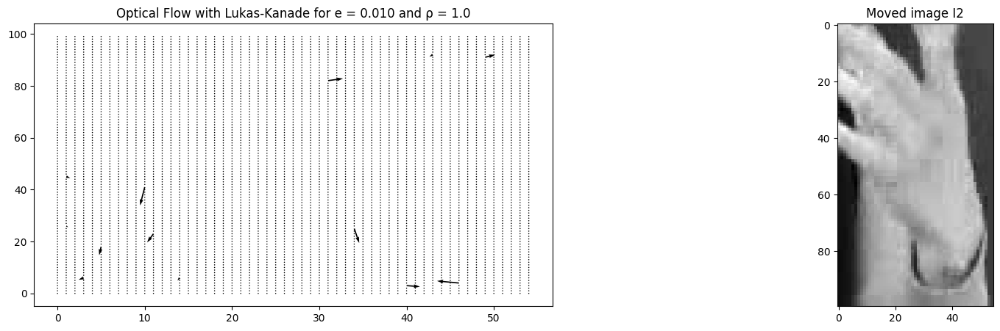

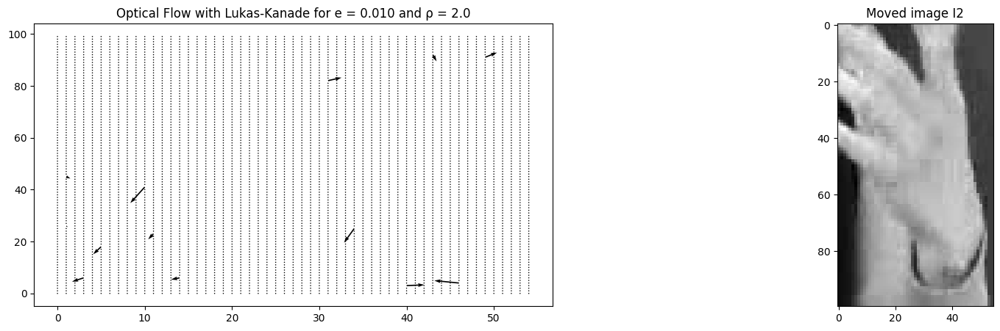

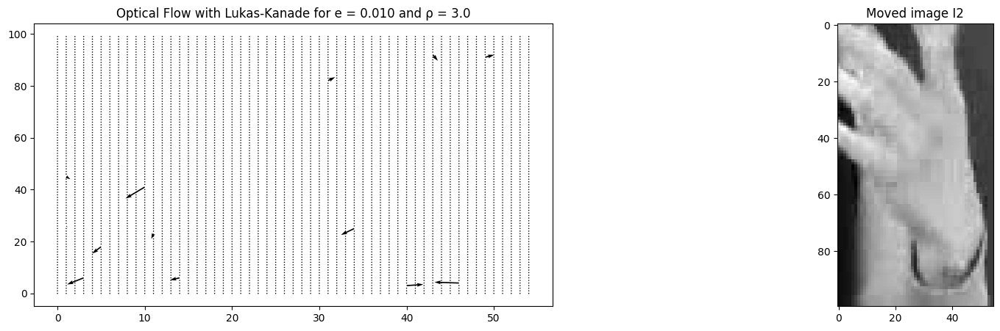

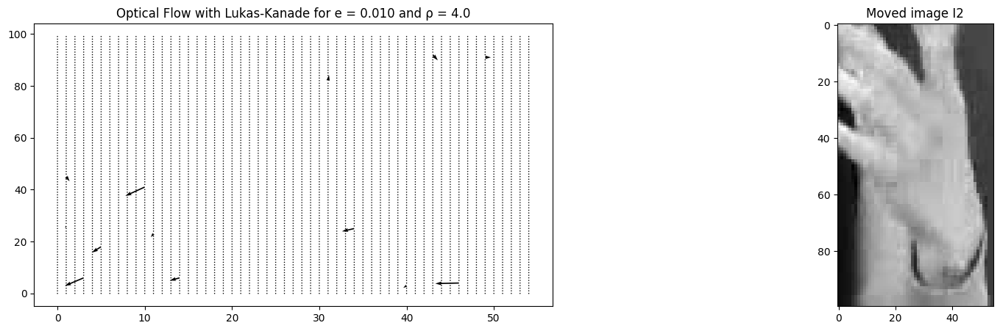

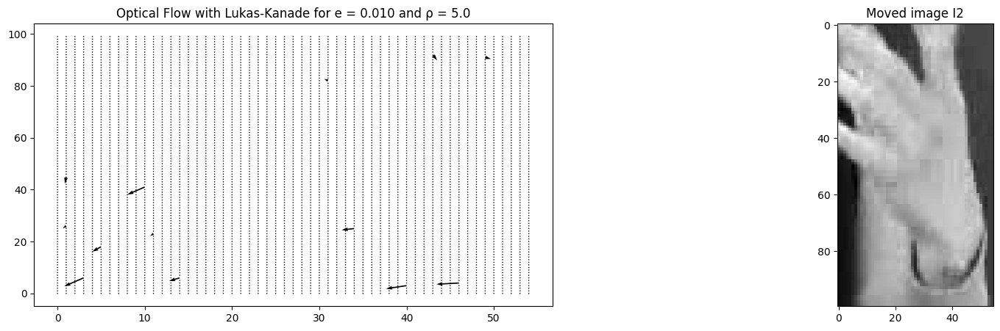

In [63]:
#2) Analysis of ρ parameter
########################
for i in range(5):
    x,y,w,h = right_hand_coord
    I1 = gray_img[y:y+h,x:x+w]
    I2 = gray_img[y+5:y+h+5,x+5:x+w+5]
    feats = cv2.goodFeaturesToTrack(I1,1000,0.1,0.1)
    dx0 = np.zeros(I1.shape)
    dy0 = np.zeros(I1.shape)
    dx,dy = lk(I1,I2,feats,rho=r0s[i],epsilon=0.1,d_x0=dx0,d_y0=dy0)
    e0=0.01
    r0=r0s[i]
    fig, axis = plt.subplots(1,2,figsize = (20,5))
    axis[0].quiver(dx, dy, angles='xy', scale=100)
    axis[0].set_title("Optical Flow with Lukas-Kanade for e = %.3f" % e0 + " and ρ = %.1f" %r0)
    axis[1].imshow(I2,cmap="gray")
    axis[1].set_title("Moved image I2")

In [64]:
#3) Analysis of threshold parameter
########################
for i in range(5):
    x,y,w,h = right_hand_coord
    I1 = gray_img[y:y+h,x:x+w]
    I2 = gray_img[y+5:y+h+5,x+5:x+w+5]
    feats = cv2.goodFeaturesToTrack(I1,1000,0.1,0.1)
    dx0 = np.zeros(I1.shape)
    dy0 = np.zeros(I1.shape)
    dx,dy = lk(I1,I2,feats,rho=5,epsilon=0.1,d_x0=dx0,d_y0=dy0)
    dx_mean,dy_mean=displ(dx,dy,thrs[i])
    e0=0.1
    r0=5
    thr=thrs[i]
    print("e = %.3f" %e0+" ,ρ = %.3f" %r0+" ,threshold = %.3f" %thr+ " ,dx = %.3f" %dx_mean+" ,dy = %.3f" %dy_mean)

e = 0.100 ,ρ = 5.000 ,threshold = 0.001 ,dx = -1.300 ,dy = -1.338
e = 0.100 ,ρ = 5.000 ,threshold = 0.100 ,dx = -2.119 ,dy = -1.809
e = 0.100 ,ρ = 5.000 ,threshold = 0.200 ,dx = -2.411 ,dy = -1.871
e = 0.100 ,ρ = 5.000 ,threshold = 0.500 ,dx = -3.055 ,dy = -2.233
e = 0.100 ,ρ = 5.000 ,threshold = 1.000 ,dx = -4.284 ,dy = -0.766


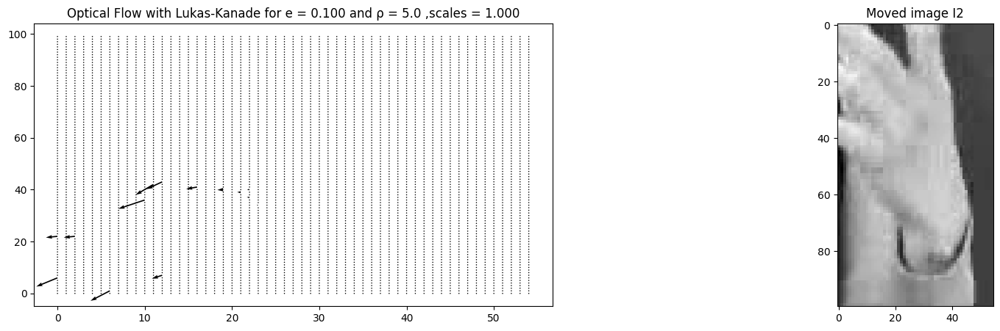

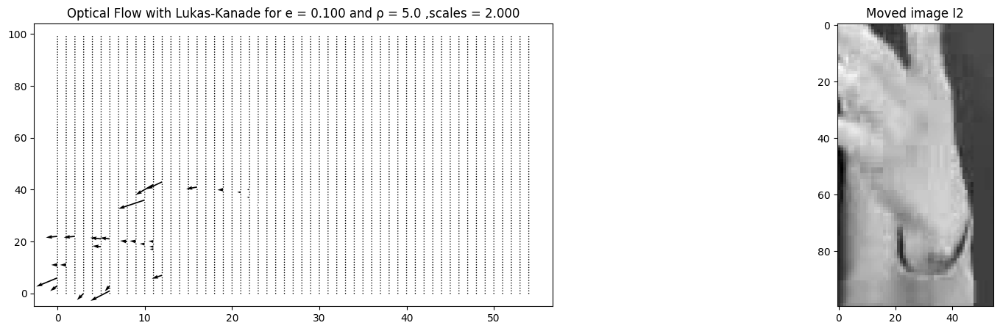

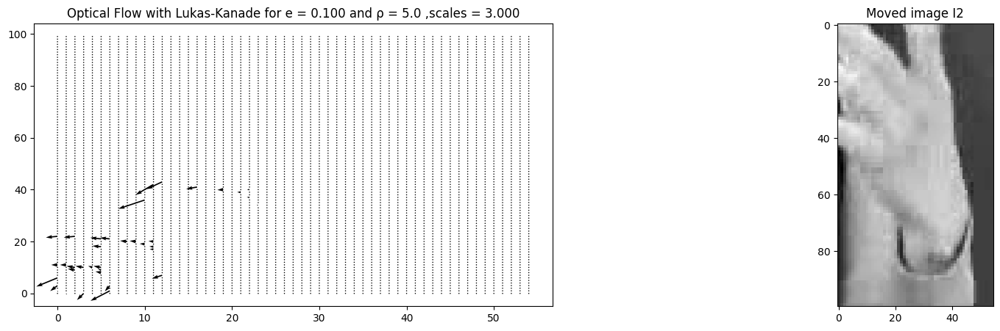

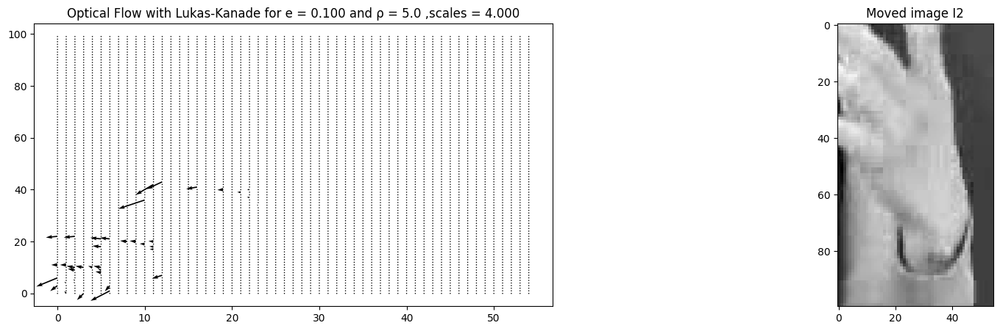

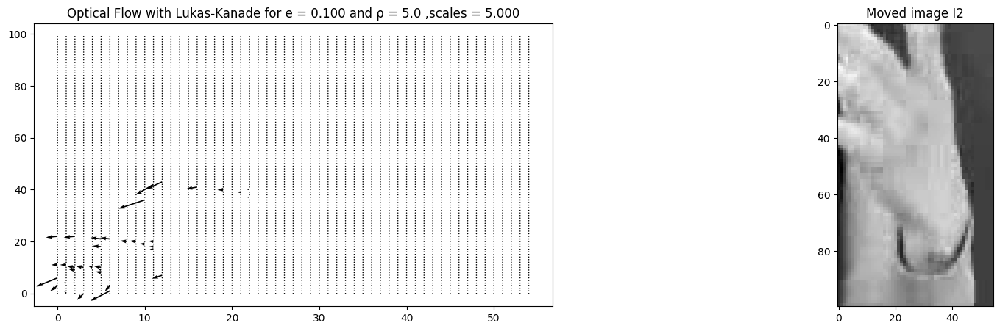

In [74]:
#4) Analysis of scale parameter
########################
for i in range(5):
    x,y,w,h = right_hand_coord
    I1 = gray_img[y:y+h,x:x+w]
    I2 = gray_img[y+10:y+h+10,x+10:x+w+10]
    feats = cv2.goodFeaturesToTrack(I1,1000,0.1,0.1)
    dx0 = np.zeros(I1.shape)
    dy0 = np.zeros(I1.shape)
    dx, dy = multiscale_lk(I1,I2,5,0.1,scales[i])
    dx_mean,dy_mean=displ(dx,dy,0.2)
    e0=0.1
    r0=5
    sc=scales[i]
    fig, axis = plt.subplots(1,2,figsize = (20,5))
    axis[0].quiver(dx, dy, angles='xy', scale=100)
    axis[0].set_title("Optical Flow with Lukas-Kanade for e = %.3f" % e0 + " and ρ = %.1f" %r0 + " ,scales = %.3f"%sc)
    axis[1].imshow(I2,cmap="gray")
    axis[1].set_title("Moved image I2")